**HECHO POR JUAN ETCHART  Y GABRIEL FERRER**

# Trabajo Integrador Final: Librería para el procesamiento y análisis de señales de EEG, ECG y EMG

**Carrera:** Ingeniería Biomédica  
**Unidad Curricular:** Programación Digital Avanzada   
**Semestre:** 7  
**Docentes:** MSc. Bioing. BALDEZZARI Lucas, Ing. ALVAREZ Emiliano  
**Fecha:** 30/06/25  

---

## Introducción

El análisis y procesamiento de señales fisiológicas es una de las diciplinas en ingeniería biomédica. Las señales de electroencefalografía (EEG), electrocardiografía (ECG) y electromiografía (EMG) son fundamentales para el diagnóstico, monitorización e investigación de diversas condiciones médicas. Este trabajo tiene como propósito diseñar e implementar una librería en Python basada en Programación Orientada a Objetos (POO) para el procesamiento, análisis y visualización de estas señales.

---

## Objetivos

### Objetivo General
Diseñar, desarrollar e implementar una librería en Python para el procesamiento, análisis y visualización de señales fisiológicas de EEG, ECG y EMG utilizando POO.

### Objetivos Específicos
- Utilizar NumPy y Pandas para el manejo eficiente de datos.
- Emplear Matplotlib para visualizar señales.
- Implementar técnicas de procesamiento como filtrado, detección de picos y análisis espectral.
- Visualizar correctamente las señales en diferentes dominios.
- Aplicar conceptos de POO en Python.
- Gestionar el proyecto con Git y GitHub.

---

## Materiales y Métodos

- **Python:** Versión 3.10 o superior.
- **Entorno de Desarrollo:** Visual Studio Code (codificación principal) y Jupyter Notebook (demostración).
- **Repositorio:** GitHub para almacenar la implementación y documentación.
- **Librerías:** NumPy, Pandas, Matplotlib y scipy.signal.

**Nota:** Aunque la codificación principal no se recomienda en Jupyter Notebook debido a limitaciones como el autocompletado y la depuración, este documento se presenta en este formato para la demostración final.

---

## Clases de la Librería

A continuación, se describen las clases implementadas con sus atributos y métodos mínimos, dejando espacios para insertar el código correspondiente.

### Clase `Info`
**Propósito:** Almacenar información relevante sobre las señales procesadas.  
**Atributos:**
- Lista con los nombres de los canales (ej: ["C3", "Cz", "C4"]).
- Lista con el tipo de cada canal (ej: ["eeg", "eeg", "eeg"]).
- Lista con los nombres de los canales marcados como "malos".
- Frecuencia de muestreo en Hz (entero o float).
- Descripción del registro de datos (str).
- Nombre del experimentador o autor del estudio (str).
- Diccionario con información adicional del sujeto (ej: {"edad": 29, "sexo": "M"}).

**Métodos:**
- **__contains__():** Permite verificar si un atributo existe dentro del objeto.
- **__getitem__():** Permite acceder a los atributos como si el objeto fuera un diccionario.
- **__len__():** Devuelve la cantidad total de atributos definidos en el objeto.
- **get():** Devuelve el valor del atributo especificado por la clave.
- **keys():** Retorna los nombres de todos los atributos del objeto, como un dict_keys().
- **items():** Devuelve una lista de tuplas con los atributos y sus respectivos valores.
- **rename_channels():** Permite cambiar los nombres de uno o más canales existentes.
- **copy():** Devuelve una copia completa del objeto Info actual, útil para evitar modificar el original.

### Clase `Anotaciones`
**Propósito:** Gestionar anotaciones asociadas a las señales.   
**Atributos:**   
-DataFrame que contiene las anotaciones en formato de columnas como 'onset', 'duration' y 'event_id'.

**Métodos:**
- **add():** Agrega una nueva anotación al DataFrame con parámetros esperados onset: tiempo de inicio (float), duration: duración del evento (float), event_id: descripción del evento (str).
- **remove():** Elimina una anotación por valor en una columna (por defecto event_id), o índice de fila (por_indice=True).
- **find():** Busca una o más filas por valor en una columna o por índice.
- **get_annotations():** Devuelve todas las anotaciones almacenadas como un DataFrame.
- **save():** Guarda las anotaciones en un archivo .csv en la ruta especificada.
- **load():** Carga un archivo .csv como tabla de anotaciones. Valida que tenga las columnas ['onset', 'duration', 'event_id'].

### Clase `RawSignal`
**Propósito:** Representar una señal genérica con métodos para procesamiento y análisis.  
**Atributos:**
- Matriz 2D (numpy.ndarray) con forma (n_canales, n_muestras) que contiene los datos de la señal fisiológica.
- Frecuencia de muestreo (float) en Hz, que indica cuántas muestras por segundo fueron tomadas.
- Índice entero que indica la primera muestra válida o considerada en la señal.
- Objeto de la clase Info que contiene metadatos sobre la señal (nombres de canales, tipos, sujeto, etc.).
- Objeto de la clase Anotaciones que almacena los eventos o marcas relevantes asociadas a la señal.

**Métodos:**
- **get_data():** Devuelve un fragmento de los datos entre los tiempos start y stop, pudiendo seleccionar canales específicos (picks), eliminar canales que superen un umbral (reject) y retornar el vector de tiempos (times).
- **drop_chanel():** Elimina uno o más canales especificados por nombre, devolviendo una nueva instancia de RawSignal sin esos canales.
- **tiempo():** Calcula y retorna la duración (en segundos) del registro a partir del índice first_samp hasta el final de los datos.
- **crop():** Recorta la señal en el rango temporal [tmin, tmax] y devuelve una nueva instancia de RawSignal con solo ese segmento de datos.
- **describe():** Devuelve un DataFrame con estadísticas descriptivas (mínimo, cuartiles, mediana, máximo, nombre y tipo) de cada canal del objeto RawSignal.
- **filter()** Aplica un filtro pasa banda entre l_freq y h_freq, y un filtro notch en notch_freq para eliminar ruido, devolviendo una nueva señal filtrada como RawSignal.
- **pick():** Selecciona un subconjunto de canales (por nombre o índice) y retorna una nueva instancia de RawSignal solo con esos canales.
- **plot():** Grafica un segmento de la señal a partir del segundo start durante duration segundos. Permite mostrar anotaciones y elegir colores por canal.
- **__getitem__():** Permite acceder a los datos con sintaxis como raw["C3"] o raw["C3", 0:512]. Retorna datos y tiempos de los canales/segmentos seleccionados.
- **espectro_potencias():** Calcula el espectro de potencia de la señal usando el método de Welch o FFT directa. Opcionalmente, muestra un gráfico del espectro.
- **_color_random_hex():** Genera un color aleatorio en formato hexadecimal. Método interno usado en plot() para asignar colores automáticamente.

### Clase `EEGSignal`
**Propósito:** Representar y analizar señales de EEG.  
**Atributos:**
- Placeholder para el valor de referencia promedio (a definir según necesidad).
- Canal por defecto utilizado como referencia (primer canal en ch_names).
- Resultado del filtro Laplaciano aplicado al canal de referencia con vecinos definidos.

**Métodos:**
- **filtro_laplaciano():** Aplica un filtro Laplaciano espacial, que resta al canal central el promedio de sus vecinos (ej. C3 - prom(Cz, C4)).
- **hilbert():** Calcula la transformada de Hilbert para uno o varios canales EEG.


### Clase `ECGSignal`
**Propósito:** Representar y analizar señales de ECG.  
**Atributos:**
- Array con los índices temporales de los picos R detectados en los canales ECG.
- Frecuencia cardíaca estimada (en latidos por minuto, bpm).

**Métodos:**
- **picos_R():** Detecta los picos R de la señal ECG usando el algoritmo find_peaks() de scipy.signal.
- **f_cardiaca():** Calcula la frecuencia cardíaca promedio (en BPM) a partir del tiempo entre picos R consecutivos.

### Clase `EMGSignal`
**Propósito:** Representar y analizar señales de EMG.  
**Atributos:**
- Umbral de activación (en µV) para detectar actividad muscular relevante.
- Índices de activaciones detectadas (opcional, se puede guardar tras detección).

**Métodos:**
- **detectando_umbrales():** Detecta los índices temporales en los que la señal EMG supera el umbral de activación definido (en valor absoluto).
- **hilbert():** Calcula la transformada de Hilbert para uno o más canales EMG.

---

## Diagrama UML

**Descripción:** Representación gráfica de las relaciones entre las clases implementadas.

---


# Demostración de clase `Anotaciones`

**Método load()**

In [ ]:
from Clase_Anotaciones import Anotaciones

# Cargar datos
anot = Anotaciones()
anot.load("/content/eventos_ejemplo.csv")

**Método get_annotations**

In [ ]:
# Mostrar las anotaciones del .csv
print(anot.get_annotations())

         onset  duration   event_id
0    37.548828       5.0  IZQUIERDA
1    54.048828       5.0    DERECHA
2    70.482422       5.0    DERECHA
3    88.632812       5.0    DERECHA
4   104.984375       5.0  IZQUIERDA
5   122.300781       5.0  IZQUIERDA
6   140.085938       5.0    DERECHA
7   157.287109       5.0    DERECHA
8   173.853516       5.0    DERECHA
9   190.685547       5.0    DERECHA
10  207.953125       5.0    DERECHA
11  224.320312       5.0  IZQUIERDA
12  242.087891       5.0  IZQUIERDA
13  258.921875       5.0  IZQUIERDA
14  277.089844       5.0  IZQUIERDA
15  294.857422       5.0  IZQUIERDA
16  312.341797       5.0    DERECHA
17  329.591797       5.0  IZQUIERDA
18  347.226562       5.0    DERECHA
19  364.794922       5.0  IZQUIERDA
20  415.935547       5.0  IZQUIERDA
21  433.669922       5.0    DERECHA
22  451.855469       5.0    DERECHA
23  468.789062       5.0  IZQUIERDA
24  485.337891       5.0    DERECHA
25  502.339844       5.0  IZQUIERDA
26  519.005859       5.0    

**Método add()**

In [ ]:
# Agregar nueva fila
anot.add(onset=749.45, duration=7.0, event_id="DERECHA")
print(anot.get_annotations())

         onset  duration   event_id
0    37.548828       5.0  IZQUIERDA
1    54.048828       5.0    DERECHA
2    70.482422       5.0    DERECHA
3    88.632812       5.0    DERECHA
4   104.984375       5.0  IZQUIERDA
5   122.300781       5.0  IZQUIERDA
6   140.085938       5.0    DERECHA
7   157.287109       5.0    DERECHA
8   173.853516       5.0    DERECHA
9   190.685547       5.0    DERECHA
10  207.953125       5.0    DERECHA
11  224.320312       5.0  IZQUIERDA
12  242.087891       5.0  IZQUIERDA
13  258.921875       5.0  IZQUIERDA
14  277.089844       5.0  IZQUIERDA
15  294.857422       5.0  IZQUIERDA
16  312.341797       5.0    DERECHA
17  329.591797       5.0  IZQUIERDA
18  347.226562       5.0    DERECHA
19  364.794922       5.0  IZQUIERDA
20  415.935547       5.0  IZQUIERDA
21  433.669922       5.0    DERECHA
22  451.855469       5.0    DERECHA
23  468.789062       5.0  IZQUIERDA
24  485.337891       5.0    DERECHA
25  502.339844       5.0  IZQUIERDA
26  519.005859       5.0    

**Método remove()**

In [ ]:
# Eliminar fila
anot.remove(40, por_indice=True)
print(anot.get_annotations())

         onset  duration   event_id
0    37.548828       5.0  IZQUIERDA
1    54.048828       5.0    DERECHA
2    70.482422       5.0    DERECHA
3    88.632812       5.0    DERECHA
4   104.984375       5.0  IZQUIERDA
5   122.300781       5.0  IZQUIERDA
6   140.085938       5.0    DERECHA
7   157.287109       5.0    DERECHA
8   173.853516       5.0    DERECHA
9   190.685547       5.0    DERECHA
10  207.953125       5.0    DERECHA
11  224.320312       5.0  IZQUIERDA
12  242.087891       5.0  IZQUIERDA
13  258.921875       5.0  IZQUIERDA
14  277.089844       5.0  IZQUIERDA
15  294.857422       5.0  IZQUIERDA
16  312.341797       5.0    DERECHA
17  329.591797       5.0  IZQUIERDA
18  347.226562       5.0    DERECHA
19  364.794922       5.0  IZQUIERDA
20  415.935547       5.0  IZQUIERDA
21  433.669922       5.0    DERECHA
22  451.855469       5.0    DERECHA
23  468.789062       5.0  IZQUIERDA
24  485.337891       5.0    DERECHA
25  502.339844       5.0  IZQUIERDA
26  519.005859       5.0    

**Método find()**

In [ ]:
# Búsca una anotación específica
anot.find(29, por_indice=True)

Fila encontrada en el índice 29:


,onset,duration,event_id
29,570.074219,5.0,IZQUIERDA


**Método save()**

In [ ]:
# Guarda los cambios en el .csv
anot.save("/content/eventos_ejemplo.csv")

Archivo guardado en: /content/eventos_ejemplo.csv


---
# Demostración de clase `RawSignal`

**Para inicializar**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from Clase_RawSignal import RawSignal
from pda import Info
from Clase_Anotaciones import Anotaciones

# Configuración inicial
data_path = "/content/s00.csv"
annotations_path = "/content/eventos_ejemplo.csv"

# Verificar si los archivos existen
try:
    data = pd.read_csv(data_path, header=None).values.T  # Transponer para que sea (n_canales, n_muestras)
    print(f"Datos cargados correctamente desde {data_path}. Forma: {data.shape}")
except FileNotFoundError:
    print(f"Error: El archivo {data_path} no se encontró. Verifica la ruta.")
    exit()

# Crear objeto Info
canales = [f"Ch{i+1}" for i in range(data.shape[0])]
info = Info(ch_names=canales, ch_types="eeg", sfreq=512, description="EEG de prueba")

# Crear objeto RawSignal
raw = RawSignal(data=data, sfreq=512, info=info)
print("Objeto RawSignal creado con éxito.")

Datos cargados correctamente desde /content/s00.csv. Forma: (19, 31000)
Objeto RawSignal creado con éxito.


**Método get_data()**

In [ ]:
# Obtener todos los canales desde t=0 hasta t=0.2 segundos (1536 muestras)
data_segment, times = raw.get_data(start=0, stop=int(3 * raw.sfreq), times=True)
print(f"Segmento de datos (todos los canales, 0-3s): {data_segment.shape}")
# Obtener un solo canal (Ch1)
data_ch1 = raw.get_data(picks="Ch1", start=0, stop=int(3 * raw.sfreq))
print(f"Datos del canal Ch1 (0-3s): {data_ch1.shape}")

Segmento de datos (todos los canales, 0-3s): (19, 1536)
Datos del canal Ch1 (0-3s): (1, 1536)


**Método drop_chanel()**

In [ ]:
# Eliminar el canal Ch2
raw_dropped = raw.drop_chanel("Ch2")
print(f"Canales después de eliminar Ch2: {raw_dropped.info.ch_names}")
print(f"Forma de los datos después de eliminar Ch2: {raw_dropped.data.shape}")

Canales después de eliminar Ch2: ['Ch1', 'Ch3', 'Ch4', 'Ch5', 'Ch6', 'Ch7', 'Ch8', 'Ch9', 'Ch10', 'Ch11', 'Ch12', 'Ch13', 'Ch14', 'Ch15', 'Ch16', 'Ch17', 'Ch18', 'Ch19']
Forma de los datos después de eliminar Ch2: (18, 31000)


**Método tiempo()**

In [ ]:
# Informa cuanto dura la señal
duracion = raw.tiempo()
print(f"Duración total de la señal: {duracion:.3f} segundos")

Duración total de la señal: 60.547 segundos


**Método crop()**

In [ ]:
# Recortar la señal de 0 a 3 segundos
raw_cropped = raw.crop(tmin=0, tmax=3)
print(f"Forma de los datos recortados (0-3s): {raw_cropped.data.shape}")
print(f"Duración del segmento recortado: {raw_cropped.tiempo():.3f} segundos")

Forma de los datos recortados (0-3s): (19, 1536)
Duración del segmento recortado: 3.000 segundos


**Método describe()**

In [ ]:
# Describe la información de los canales
desc = raw.describe()
print("Descripción estadística de los canales:")
print(desc)

Descripción estadística de los canales:
    Name Type     Min        Q1   Mediana        Q3     Max
0    Ch1  eeg -93.347 -9.258100 -0.000414  9.685500  78.811
1    Ch2  eeg -82.339 -7.683400  0.006548  7.380500  47.909
2    Ch3  eeg -68.406 -8.803325  0.000025  8.132900  46.165
3    Ch4  eeg -58.415 -7.861800  0.000023  7.945800  45.455
4    Ch5  eeg -74.958 -8.492125 -0.001488  8.263100  48.981
5    Ch6  eeg -70.010 -8.489850 -0.045457  7.891500  49.068
6    Ch7  eeg -56.657 -7.419200 -0.000284  7.448600  47.981
7    Ch8  eeg -67.151 -8.175500 -0.139490  8.220100  62.347
8    Ch9  eeg -55.330 -7.778300 -0.000798  7.474000  39.125
9   Ch10  eeg -49.501 -7.196625 -0.000118  7.515025  36.773
10  Ch11  eeg -54.153 -6.521475 -0.001017  6.410600  47.414
11  Ch12  eeg -42.214 -7.126675  0.068247  7.536600  57.599
12  Ch13  eeg -56.228 -6.601100  0.078299  6.785700  58.512
13  Ch14  eeg -58.340 -7.315025 -0.001314  7.422100  57.176
14  Ch15  eeg -53.913 -8.169500  0.001058  7.916700  55.967


**Método filter()**

Forma de los datos filtrados: (19, 31000)


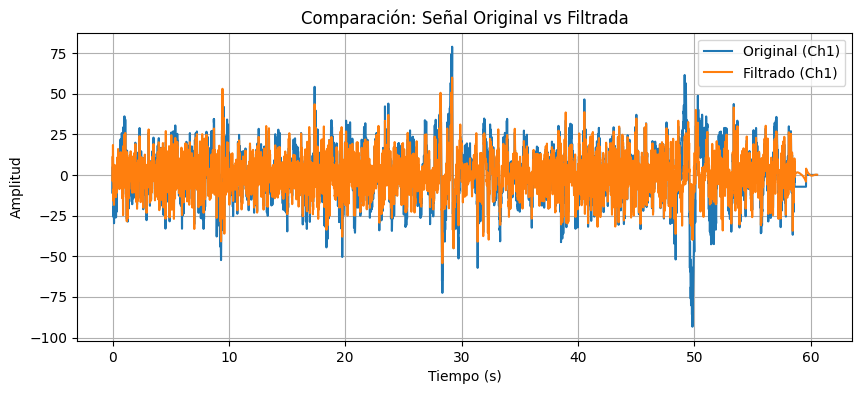

In [ ]:
# Aplicar filtro pasabanda (1-40 Hz) y notch (50 Hz)
raw_filtered = raw.filter(l_freq=1, h_freq=40, notch_freq=50, order=4)
print(f"Forma de los datos filtrados: {raw_filtered.data.shape}")
# Graficar el primer canal antes y después del filtrado
plt.figure(figsize=(10, 4))
plt.plot(np.arange(data.shape[1]) / raw.sfreq, raw.data[0], label="Original (Ch1)")
plt.plot(np.arange(data.shape[1]) / raw.sfreq, raw_filtered.data[0], label="Filtrado (Ch1)")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.title("Comparación: Señal Original vs Filtrada")
plt.legend()
plt.grid(True)
plt.show()

**Método pick()**

In [ ]:
# Seleccionar los canales Ch1 y Ch3
raw_picked = raw.pick(["Ch1", "Ch3"])
print(f"Canales seleccionados: {raw_picked.info.ch_names}")
print(f"Forma de los datos seleccionados: {raw_picked.data.shape}")

Canales seleccionados: ['Ch1', 'Ch3']
Forma de los datos seleccionados: (2, 31000)


**Método plot()**

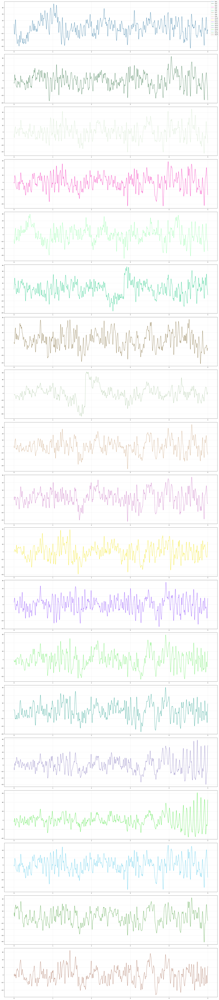

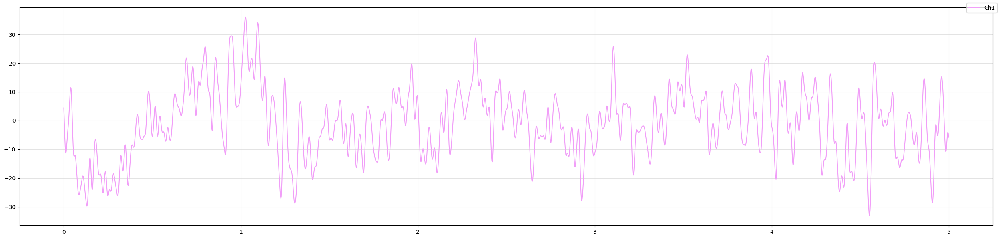

In [ ]:
# Graficar todos los canales para 5 segundos
raw.plot(start=0, duration=5, show_anotaciones=False)
# Graficar solo el canal Ch1 con un color específico
raw.plot(picks="Ch1", start=0, duration=5, show_anotaciones=False, color="blue")

**Método show_anotaciones**

Anotaciones cargadas correctamente:
        onset  duration   event_id
0   37.548828       5.0  IZQUIERDA
1   54.048828       5.0    DERECHA
2   70.482422       5.0    DERECHA
3   88.632812       5.0    DERECHA
4  104.984375       5.0  IZQUIERDA


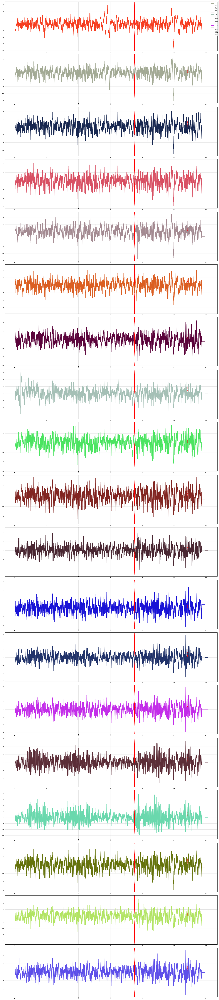

In [ ]:
# Cargar anotaciones desde eventos_ejemplo.csv
try:
    anot = Anotaciones()
    anot.load(annotations_path)
    print("Anotaciones cargadas correctamente:")
    print(anot.get_annotations().head())
    # Asignar anotaciones a RawSignal
    raw.anotaciones = anot
    # Graficar con anotaciones
    raw.plot(start=0, duration=raw.tiempo(), show_anotaciones=True)
except FileNotFoundError:
    print(f"Error: El archivo {annotations_path} no se encontró. Omitiendo prueba de anotaciones.")

**Método espectro_potencias()**

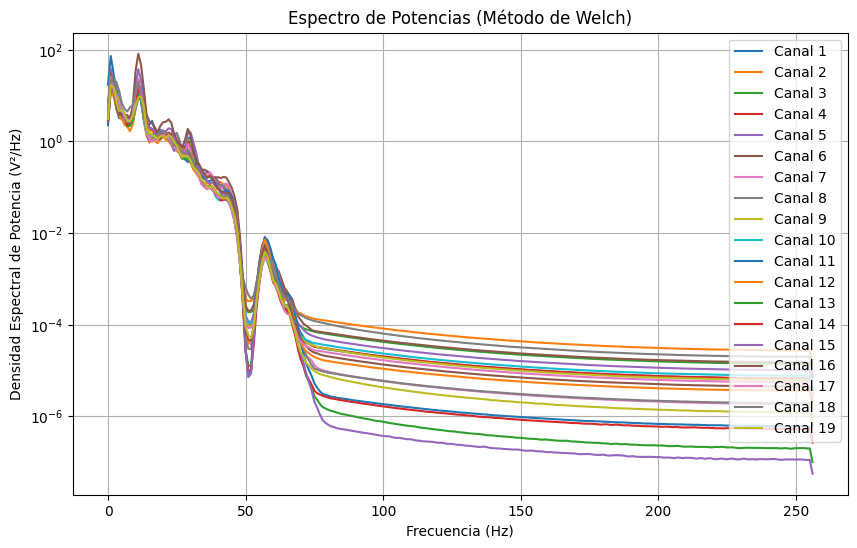

Forma del espectro de potencias: (19, 257)


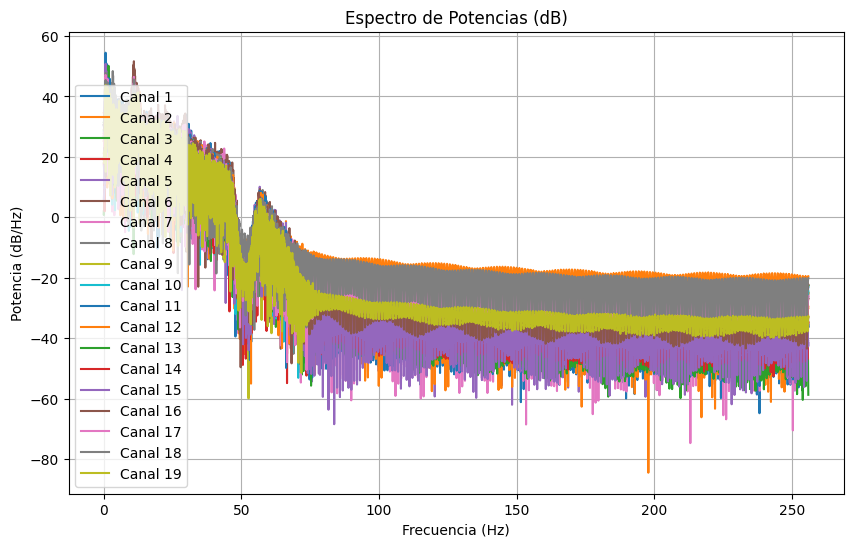

Forma del espectro FFT: (19, 15501)


In [ ]:
# Calcular y graficar el espectro de potencias usando Welch
frecuencias, psd = raw.espectro_potencias(metodo="welch", nperseg=512, plot=True)
print(f"Forma del espectro de potencias: {psd.shape}")
# Probar con FFT
frecuencias_fft, psd_fft = raw.espectro_potencias(metodo="fft", plot=True)
print(f"Forma del espectro FFT: {psd_fft.shape}")

**Método tiempo_frecuencia()**

/content/Clase_RawSignal.py:485: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(tiempos, frecuencias, 10 * np.log10(Sxx), shading='auto', cmap='inferno')


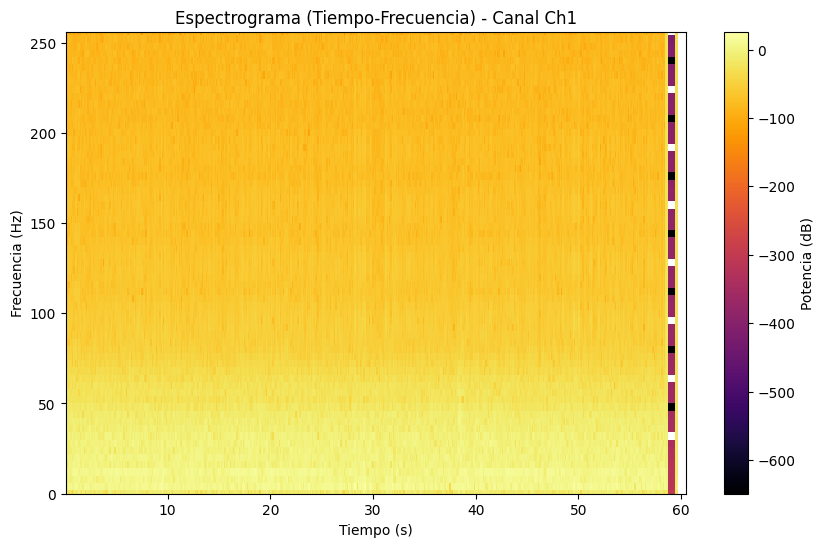

Forma del espectrograma: (65, 483)


In [ ]:
# Calcular y graficar el espectrograma para el canal Ch1
frecuencias, tiempos, sxx = raw.tiempo_frecuencia(pick="Ch1", plot=True)
print(f"Forma del espectrograma: {sxx.shape}")

---

## Conclusiones

El sistema desarrollado para la gestión de anotaciones y señales EEG, EMG y ECG cumple exitosamente con los requerimientos establecidos para el análisis de señales fisiológicas. Las principales funcionalidades implementadas incluyen:

- **Gestión de anotaciones:** Permite la carga, manipulación y guardado de eventos en archivos CSV, facilitando la organización de datos temporales.   
- **Procesamiento de señales:** Posee herramientas como visualización, filtrado y detección de picos, asegurando un análisis detallado y preciso de las señales fisiológicas.   
- **Integración:** La capacidad de asociar y visualizar anotaciones junto con las señales mejora significativamente la interpretación de los datos, permitiendo una correlación directa entre eventos y la señal con la que se trabaje.   
- **Robustez:** El sistema incorpora validaciones y manejo de errores, lo que permite un funcionamiento confiable.

En conjunto, estas características hacen del sistema una herramienta valiosa para aplicaciones en investigación científica y diagnóstico clínico, optimizando el manejo y análisis de datos EEG, EMG y ECG, de manera eficiente y efectiva.

---

## Referencias

[1] L. Baldezzari, "Librería para el procesamiento y análisis de señales de EEG, ECG y EMG," Universidad Tecnológica, Fray Bentos, Uruguay, 2025   
[2] J. Etchart y G. Ferrer, "TIF", Montevideo, Uruguay, 2025. [En línea]. Disponible en: https://github.com/Juanchi2004/TIF.git

---
